# Treinamento da MarkerNet — MoNuSeg (treino oficial + validação no teste oficial)

Este notebook treina a **MarkerNet** usando a rede final congelada (ScribblePrompt) como camada de loss,
incorporando as correções da investigação (`docs/investigacao_experimento_1.md`):

1. **Split sem vazamento de teste (C6):** treino nas **30 imagens oficiais de treino** do MoNuSeg e
   validação nas **14 oficiais de teste** — nada de misturar o conjunto de teste no treino;
2. **Pré-processamento** (Cellpose + RGBA + mapa de distância) em resolução de trabalho **256×256** (P7);
3. **Batches com mais de 1 imagem** (batch size 4) para estabilizar BatchNorm e reduzir ruído do gradiente (P4);
4. **Treinamento** da MarkerNet através da rede final congelada (ScribblePrompt), com:
   - MarkerNet em modo `train()` (P3);
   - scribbles *sharpened* (quase binários) — mais próximos da distribuição de treino do ScribblePrompt (C2);
   - loss `Dice + RMSE + Size + DMap` — o mapa de distância agora supervisiona os **marcadores** diretamente (P11/C3/C4);
   - `SizeTerm` simétrico em torno de 1.0 (P10);
   - grad clipping + scheduler CosineAnnealing (P5);
   - callback de **grad-norm** para diagnóstico de gradiente morto (P1/E1);
5. **Avaliação** (curvas de loss, grad-norm, visualização) e **checkpoint** persistido (P12/E8).

Fluxo do pipeline de treinamento:

```
rgba → MarkerStep (MarkerNet diferenciável, train()) → markers
→ FrozenSegmentationStep (ScribblePrompt congelado) → segmentation
→ LossComposer (dice + rmse + size + dmap) → backward até a MarkerNet
```

> **Configurações:** 50 épocas, batch de 4 imagens, resolução de trabalho 256×256, lr 1e-4 com
> CosineAnnealing, grad clip 1.0 e checkpoint salvo ao final.


## 0. Setup

**Colab:** instale as dependências na célula abaixo (`requirements.txt` fixa todas as versões; torch/torchvision preservam a build GPU do Colab).

**Local:** garanta que o `.venv` esteja ativo com as dependências instaladas.


In [1]:
# Clone the repository containing the project code (apenas no Colab)
import sys
import os
repo_dir = 'cell-fuzzy-seg'
# if not os.path.exists(repo_dir):
#     !git clone --branch homolog https://github.com/Pedro-io/cell-fuzzy-seg.git
# Local: pule esta célula e rode o notebook a partir da raiz do projeto.
%cd {repo_dir}
sys.path.append(f"/content/{repo_dir}")


/content/cell-fuzzy-seg


In [2]:
%ls

CITATION.cff  docs/      notebooks/        README.md         tests/
configs/      jornal.md  pipeline_test.py  requirements.txt
data_source/  LICENSE    pyproject.toml    src/


In [3]:
# Instala as dependências (apenas no Colab / primeira execução)
import sys

if "google.colab" in sys.modules:
    get_ipython().system("python -m pip install -r requirements.txt -q")
else:
    print("Ambiente local: verifique se as dependências estão instaladas no .venv.")


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.4/213.4 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 20.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 12.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 130.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 83.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 80.8 MB/s eta 0:00:00:00:0100:01


In [4]:
%ls

CITATION.cff  docs/      notebooks/        README.md         tests/
configs/      jornal.md  pipeline_test.py  requirements.txt
data_source/  LICENSE    pyproject.toml    src/


## 1. Imports e dispositivo

In [5]:
import os
import sys
import cv2
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

# Garante que a raiz do projeto esteja no path (robusto para upload/clone no Colab)
ROOT = os.getcwd()
if ROOT not in sys.path:
    sys.path.insert(0, ROOT)

from src.data.load.monuseg_dataset import MonusegDataset
from src.pipeline.preprocessing_pipeline import PreprocessingPipeline
from src.pipeline.steps.preprocessing.cellpose_step import CellposeStep
from src.pipeline.steps.preprocessing.rgba_step import RGBAStep
from src.pipeline.steps.preprocessing.distance_map_step import DistanceMapStep
from src.pipeline.training_pipeline import TrainingPipeline
from src.pipeline.steps.inference.marker_step import MarkerStep
from src.pipeline.steps.inference.frozen_segmentation_step import FrozenSegmentationStep
from src.models.networks.marker_unet import MarkerUNet
from src.models.configs.marker_unet_config import UNET_CONFIG
from src.models.networks.final_segmentation.base_final_segmentation import BaseFinalSegmentation
from src.losses.terms import DiceTerm, RMSETerm, SizeTerm, DMapTerm
from src.losses.loss_composer import LossComposer
from src.training.trainer import Trainer
from src.training.training_loop import TrainingLoop
from src.training.callbacks import GradNormCallback

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(42)
np.random.seed(42)
print(f"Device: {DEVICE}")


Device: cuda


## 2. Leitura — treino oficial e teste oficial separados

Carregamos as **30 imagens oficiais de treino** e as **14 oficiais de teste** do MoNuSeg em conjuntos
**separados** (C6). O conjunto de teste é usado apenas para validação — qualquer métrica reportada aqui
é comparável com a literatura do MoNuSeg.

In [6]:
train_dataset = MonusegDataset(dataset_name="monuseg", config_key="monuseg_training")
test_dataset = MonusegDataset(dataset_name="monuseg", config_key="monuseg_test")
print(f"Treino (oficial): {len(train_dataset)} imagens | Teste (oficial): {len(test_dataset)} imagens")

train_samples = [train_dataset[i] for i in range(len(train_dataset))]
test_samples = [test_dataset[i] for i in range(len(test_dataset))]
print("ids de treino:", [s["id"] for s in train_samples])
print("ids de teste:", [s["id"] for s in test_samples])


2026-08-14 12:44:23.717 | DEBUG    | src.data.load.monuseg_dataset:_get_file_pairs:99 - Getting file pairs from: image_dir=data_source/MoNuSegTrainingData/Tissue_Images, mask_dir=data_source/MoNuSegTrainingData/Annotations
2026-08-14 12:44:23.721 | DEBUG    | src.data.load.monuseg_dataset:_get_file_pairs:99 - Getting file pairs from: image_dir=data_source/MoNuSegTestData/Tissue_Images, mask_dir=data_source/MoNuSegTestData/Annotations
2026-08-14 12:44:23.723 | DEBUG    | src.data.load.monuseg_dataset:_load_image:54 - Loading image: data_source/MoNuSegTrainingData/Tissue_Images/TCGA-18-5592-01Z-00-DX1.tif
2026-08-14 12:44:23.777 | DEBUG    | src.data.load.monuseg_dataset:_load_mask:76 - Loading mask: data_source/MoNuSegTrainingData/Annotations/TCGA-18-5592-01Z-00-DX1.xml


Treino (oficial): 30 imagens | Teste (oficial): 14 imagens


2026-08-14 12:44:24.140 | DEBUG    | src.data.load.monuseg_dataset:_load_image:54 - Loading image: data_source/MoNuSegTrainingData/Tissue_Images/TCGA-21-5784-01Z-00-DX1.tif
2026-08-14 12:44:24.187 | DEBUG    | src.data.load.monuseg_dataset:_load_mask:76 - Loading mask: data_source/MoNuSegTrainingData/Annotations/TCGA-21-5784-01Z-00-DX1.xml
2026-08-14 12:44:24.420 | DEBUG    | src.data.load.monuseg_dataset:_load_image:54 - Loading image: data_source/MoNuSegTrainingData/Tissue_Images/TCGA-21-5786-01Z-00-DX1.tif
2026-08-14 12:44:24.469 | DEBUG    | src.data.load.monuseg_dataset:_load_mask:76 - Loading mask: data_source/MoNuSegTrainingData/Annotations/TCGA-21-5786-01Z-00-DX1.xml
2026-08-14 12:44:24.726 | DEBUG    | src.data.load.monuseg_dataset:_load_image:54 - Loading image: data_source/MoNuSegTrainingData/Tissue_Images/TCGA-38-6178-01Z-00-DX1.tif
2026-08-14 12:44:24.770 | DEBUG    | src.data.load.monuseg_dataset:_load_mask:76 - Loading mask: data_source/MoNuSegTrainingData/Annotations/TC

ids de treino: ['TCGA-18-5592-01Z-00-DX1', 'TCGA-21-5784-01Z-00-DX1', 'TCGA-21-5786-01Z-00-DX1', 'TCGA-38-6178-01Z-00-DX1', 'TCGA-49-4488-01Z-00-DX1', 'TCGA-50-5931-01Z-00-DX1', 'TCGA-A7-A13E-01Z-00-DX1', 'TCGA-A7-A13F-01Z-00-DX1', 'TCGA-AR-A1AK-01Z-00-DX1', 'TCGA-AR-A1AS-01Z-00-DX1', 'TCGA-AY-A8YK-01A-01-TS1', 'TCGA-B0-5698-01Z-00-DX1', 'TCGA-B0-5710-01Z-00-DX1', 'TCGA-B0-5711-01Z-00-DX1', 'TCGA-CH-5767-01Z-00-DX1', 'TCGA-DK-A2I6-01A-01-TS1', 'TCGA-E2-A14V-01Z-00-DX1', 'TCGA-E2-A1B5-01Z-00-DX1', 'TCGA-G2-A2EK-01A-02-TSB', 'TCGA-G9-6336-01Z-00-DX1', 'TCGA-G9-6348-01Z-00-DX1', 'TCGA-G9-6356-01Z-00-DX1', 'TCGA-G9-6362-01Z-00-DX1', 'TCGA-G9-6363-01Z-00-DX1', 'TCGA-HE-7128-01Z-00-DX1', 'TCGA-HE-7129-01Z-00-DX1', 'TCGA-HE-7130-01Z-00-DX1', 'TCGA-KB-A93J-01A-01-TS1', 'TCGA-NH-A8F7-01A-01-TS1', 'TCGA-RD-A8N9-01A-01-TS1']
ids de teste: ['TCGA-2Z-A9J9-01A-01-TS1', 'TCGA-44-2665-01B-06-BS6', 'TCGA-69-7764-01A-01-TS1', 'TCGA-A6-6782-01A-01-BS1', 'TCGA-AC-A2FO-01A-01-TS1', 'TCGA-AO-A0J2-01A-01-BSA

## 3. Pré-processamento — Cellpose + RGBA + mapa de distância (em 256²)

Executa a segmentação inicial (Cellpose), monta a imagem RGBA (RGB + alpha da máscara) e calcula o
**mapa de distância** a partir do ground truth. Tudo é feito na **resolução de trabalho 256×256** (P7):
a loss deixa de ser medida sobre o output upsampled de 128²→1000², evitando o domínio do RMSE pelas
bordas borradas do upsample e diluindo menos o gradiente fino das fronteiras celulares.

> **Fallback:** se o Cellpose não estiver disponível (sem GPU), usa o próprio ground truth como máscara
> de entrada, apenas para validar o restante do fluxo.

In [7]:
WORK_SIZE = 256  # resolução de trabalho (P7)


def resize_sample(sample, size=WORK_SIZE):
    """Reduz imagem e ground truth para a resolução de trabalho."""
    img = sample["image"]
    if img.ndim == 3 and img.shape[-1] == 4:
        img = img[..., :3]
    if img.ndim == 2:
        img = np.stack([img] * 3, axis=-1)
    img = cv2.resize(img, (size, size))
    gt = cv2.resize(sample["ground_truth"], (size, size), interpolation=cv2.INTER_NEAREST)
    return {"id": sample["id"], "image": img, "ground_truth": gt}


train_samples = [resize_sample(s) for s in train_samples]
test_samples = [resize_sample(s) for s in test_samples]
print("Exemplo:", train_samples[0]["image"].shape, train_samples[0]["ground_truth"].shape)

# Tenta usar o Cellpose; sem GPU, usa o ground truth como máscara de entrada.
try:
    cellpose_step = CellposeStep()
    preprocess = PreprocessingPipeline([cellpose_step, RGBAStep(), DistanceMapStep()])
    print("Cellpose disponível - executando pré-processamento em todas as imagens...")
except Exception as e:
    print(f"[fallback] Cellpose indisponível: {e}")
    preprocess = None


def run_preprocess(sample):
    data = {"image": sample["image"], "ground_truth": sample["ground_truth"], "id": sample["id"]}
    if preprocess is not None:
        data = preprocess.run(data, verbose=False)
    else:
        data["segmentation"] = (sample["ground_truth"] > 0).astype(np.uint8)
        data = RGBAStep()(data)
        data = DistanceMapStep()(data)
    return data


train_preprocessed = [run_preprocess(s) for s in train_samples]
test_preprocessed = [run_preprocess(s) for s in test_samples]
print(f"Pré-processadas: {len(train_preprocessed)} treino / {len(test_preprocessed)} teste")


Exemplo: (256, 256, 3) (256, 256)


100%|██████████| 1.15G/1.15G [00:14<00:00, 87.6MB/s]   
2026-08-14 12:44:56.262 | INFO     | src.pipeline.steps.preprocessing.cellpose_step:__init__:65 - [CellposeStep] Running on GPU (model=cpsam)


Cellpose disponível - executando pré-processamento em todas as imagens...


/usr/local/lib/python3.12/dist-packages/cellpose/dynamics.py:524: UserWarning: Sparse invariant checks are implicitly disabled. Memory errors (e.g. SEGFAULT) will occur when operating on a sparse tensor which violates the invariants, but checks incur performance overhead. To silence this warning, explicitly opt in or out. See `torch.sparse.check_sparse_tensor_invariants.__doc__` for guidance.  (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:760.)
  coo = torch.sparse_coo_tensor(pt, torch.ones(pt.shape[1], device=pt.device, dtype=torch.int),
2026-08-14 12:44:58.635 | DEBUG    | src.pipeline.steps.preprocessing.rgba_step:_build_rgba:75 - Building RGBA image: image shape (256, 256, 3), segmentation shape (256, 256)
2026-08-14 12:44:58.644 | DEBUG    | src.pipeline.steps.preprocessing.distance_map_step:forward:100 - [DistanceMapStep] Computed distance map with shape (256, 256)
2026-08-14 12:45:00.011 | DEBUG    | src.pipeline.steps.preprocessing.rgba_step:_build_rgba:75 - Build

Pré-processadas: 30 treino / 14 teste


## 4. Batches de treino e validação (batch size > 1)

Montamos os batches a partir das amostras já pré-processadas em 256². **Diferente do experimento
anterior (1 imagem por batch), empilhamos 4 imagens por batch (P4)**: gradientes por amostra são menos
ruidosos e as BatchNorms da MarkerNet (agora em `train()` — P3) recebem estatísticas de lote estáveis.

O split é **sem vazamento (C6)**: treino = 30 imagens oficiais, validação = 14 oficiais de teste.
O `distance_map` já foi calculado sobre o GT **na resolução de trabalho** (conforme a observação da
arquitetura: o mapa deve ser calculado sobre a máscara já redimensionada).

In [8]:
BATCH_SIZE = 4  # >1 imagem por batch (P4): estabiliza BatchNorm e reduz ruído do gradiente


def build_batch(samples, augment=False):
    """Constrói um batch empilhando as amostras pré-processadas (todas em WORK_SIZE)."""
    images, rgbs, gts, dmaps = [], [], [], []
    for s in samples:
        img = s["image"]
        rgba = s["rgba"]
        gt = s["ground_truth"]
        dmap = s["distance_map"]

        if augment:
            # Augmentação simples (P6): rotação 90° e flips aplicados de forma
            # conjunta a imagem, rgba, gt e dmap.
            k = np.random.randint(0, 4)
            if k:
                img = np.rot90(img, k).copy()
                rgba = np.rot90(rgba, k).copy()
                gt = np.rot90(gt, k).copy()
                dmap = np.rot90(dmap, k).copy()
            if np.random.rand() < 0.5:
                img = np.fliplr(img).copy()
                rgba = np.fliplr(rgba).copy()
                gt = np.fliplr(gt).copy()
                dmap = np.fliplr(dmap).copy()
            if np.random.rand() < 0.5:
                img = np.flipud(img).copy()
                rgba = np.flipud(rgba).copy()
                gt = np.flipud(gt).copy()
                dmap = np.flipud(dmap).copy()

        images.append(torch.from_numpy(img.transpose(2, 0, 1)).float())          # (3,H,W)
        rgbs.append(torch.from_numpy(rgba.transpose(2, 0, 1)).float())           # (4,H,W)
        gts.append(torch.from_numpy(gt.astype(np.float32))[None])                # (1,H,W)
        dmaps.append(torch.from_numpy(dmap.astype(np.float32))[None])            # (1,H,W)

    return {
        "id": [s["id"] for s in samples],
        "image": torch.stack(images),        # (B,3,H,W)
        "rgba": torch.stack(rgbs),           # (B,4,H,W)
        "ground_truth": torch.stack(gts),    # (B,1,H,W)
        "distance_map": torch.stack(dmaps),  # (B,1,H,W)
    }


def make_batches(samples, batch_size, augment):
    return [
        build_batch(samples[i:i + batch_size], augment=augment)
        for i in range(0, len(samples), batch_size)
    ]


# Split sem vazamento (C6): treino = 30 oficiais, validação = 14 oficiais de teste.
train_batches = make_batches(train_preprocessed, BATCH_SIZE, augment=True)
val_batches = make_batches(test_preprocessed, BATCH_SIZE, augment=False)

print(
    f"treino: {len(train_samples)} imagens em {len(train_batches)} batches "
    f"({BATCH_SIZE} por batch) | validação: {len(test_samples)} imagens em {len(val_batches)} batches"
)
b = train_batches[0]
for k, v in b.items():
    print(k, tuple(v.shape) if hasattr(v, "shape") else v)


treino: 30 imagens em 8 batches (4 por batch) | validação: 14 imagens em 4 batches
id ['TCGA-18-5592-01Z-00-DX1', 'TCGA-21-5784-01Z-00-DX1', 'TCGA-21-5786-01Z-00-DX1', 'TCGA-38-6178-01Z-00-DX1']
image (4, 3, 256, 256)
rgba (4, 4, 256, 256)
ground_truth (4, 1, 256, 256)
distance_map (4, 1, 256, 256)


## 5. Redes

- **MarkerNet** (treinável) — `smp.Unet` com encoder ResNet34 e 4 canais de entrada (RGBA);
- **Rede final congelada** — `ScribblePromptingNetwork` (ScribblePrompt-UNet v1). Se o pacote ou o
  checkpoint não estiverem disponíveis, usamos uma **rede final dummy congelada** apenas para validar
  o fluxo de gradiente.

In [9]:
# --- MarkerNet (treinável) ---
marker_net = MarkerUNet(config=UNET_CONFIG).to(DEVICE)
print("MarkerNet params:", sum(p.numel() for p in marker_net.parameters()))

# --- Rede final congelada (ScribblePrompt) ---
FINAL_NET = None
try:
    from src.models.networks.final_segmentation.scribble_prompting_network import ScribblePromptingNetwork
    os.makedirs("checkpoints", exist_ok=True)
    ckpt = ScribblePromptingNetwork.download_checkpoint("checkpoints")
    # scribble_mode="sharpened" (C2): converte os marcadores em canais quase binários
    # (pos/neg complementares), mais próximos da distribuição de treino do ScribblePrompt.
    FINAL_NET = ScribblePromptingNetwork(
        checkpoint=ckpt,
        device=DEVICE,
        resize_output=True,
        scribble_mode="sharpened",
        scribble_temperature=10.0,
    )
    print("Rede final: ScribblePrompt (congelada) — scribbles sharpened (C2)")
except Exception as e:
    print(f"[fallback] ScribblePrompt indisponível: {type(e).__name__}: {e}")

if FINAL_NET is None:
    class DummyFinalNetwork(BaseFinalSegmentation):
        # Rede final congelada mínima (apenas para validar o fluxo de gradiente).
        def __init__(self):
            super().__init__(config={})
            self.conv = nn.Sequential(
                nn.Conv2d(4, 16, 3, padding=1),
                nn.ReLU(),
                nn.Conv2d(16, 1, 3, padding=1),
            )
            self.conv.requires_grad_(False)  # congelada: o gradiente flui ATRAVÉS dela

        def forward(self, data):
            img = data["image"]
            scribbles = data["scribbles"]
            if isinstance(img, np.ndarray):
                if img.ndim == 2:
                    img = np.stack([img] * 3, axis=-1)
                img = torch.from_numpy(img.transpose(2, 0, 1)).float().unsqueeze(0)
            img = img.to(DEVICE)
            if img.max() > 1.0:
                img = img / 255.0
            s = scribbles.float().to(DEVICE)
            if s.ndim == 3:
                s = s.unsqueeze(0)
            x = torch.cat([img, s], dim=1)
            return torch.sigmoid(self.conv(x))

        def predict(self, data):
            # BaseNetwork exige predict() (abstractmethod).
            with torch.no_grad():
                return self.forward(data)

    FINAL_NET = DummyFinalNetwork().to(DEVICE)
    print("Rede final: DummyFrozen (fallback)")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:138: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
  warnings.warn(f"\nError while fetching `HF_TOKEN` secret value from your vault: '{str(e)}'.")


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 87.3MB            

model.safetensors: downloading bytes:           |  0.00B            

2026-08-14 12:46:18.521 | INFO     | src.models.networks.final_segmentation.scribble_prompting_network:download_checkpoint:383 - [ScribblePromptingNetwork] Baixando checkpoint de https://www.dropbox.com/scl/fi/pnw88n05irnv5z1snlklr/ScribblePrompt_unet_v1_nf192_res128.pt?rlkey=dr8xvkf0wj2r082h1zzpcmz5o&dl=1


MarkerNet params: 24439505


2026-08-14 12:46:22.097 | INFO     | src.models.networks.final_segmentation.scribble_prompting_network:download_checkpoint:385 - [ScribblePromptingNetwork] Checkpoint salvo em checkpoints/ScribblePrompt_unet_v1_nf192_res128.pt
2026-08-14 12:46:22.174 | INFO     | src.models.networks.final_segmentation.scribble_prompting_network:__init__:158 - [ScribblePromptingNetwork] Inicializada (version=v1, device=cuda, input_size=(128, 128))


Rede final: ScribblePrompt (congelada) — scribbles sharpened (C2)


## 6. TrainingPipeline — forward diferenciável

`MarkerStep(differentiable=True)` preserva o grafo (sem `no_grad`, sem binarização) e coloca a
MarkerNet em `train()` (P3). `FrozenSegmentationStep` repassa `{image, scribbles}` à rede final.
O resultado `segmentation` alimenta a loss.

In [10]:
marker_step = MarkerStep(model=marker_net, differentiable=True, device=DEVICE)
final_step = FrozenSegmentationStep(final_network=FINAL_NET, device=DEVICE)
training_pipeline = TrainingPipeline([marker_step, final_step])

out = training_pipeline.run(train_batches[0], verbose=False)
print("markers:", tuple(out["markers"].shape), out["markers"].dtype)
print("segmentation:", tuple(out["segmentation"].shape), out["segmentation"].dtype)
print("markers range:", float(out["markers"].min()), float(out["markers"].max()))
print("seg range:", float(out["segmentation"].min()), float(out["segmentation"].max()))
print("MarkerNet em train():", marker_net.model.training)  # deve ser True (P3)


2026-08-14 12:46:22.596 | INFO     | src.pipeline.steps.inference.marker_step:__init__:86 - [MarkerStep] Initialized on cuda (differentiable=True)
2026-08-14 12:46:22.600 | INFO     | src.pipeline.steps.inference.frozen_segmentation_step:__init__:67 - [FrozenSegmentationStep] Initialized on cuda
2026-08-14 12:46:23.524 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:46:23.613 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)


markers: (4, 1, 256, 256) torch.float32
segmentation: (4, 1, 256, 256) torch.float32
markers range: 0.03397437557578087 0.9980965256690979
seg range: 2.597760129571283e-25 0.996525228023529
MarkerNet em train(): True


/tmp/ipykernel_3666/4061798686.py:8: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)
  print("markers range:", float(out["markers"].min()), float(out["markers"].max()))


## 7. Validação de gradiente e congelamento

A loss (sobre `segmentation`) deve alcançar os pesos da **MarkerNet** e **não** deve gerar gradiente
na rede final (congelada). Além da existência do gradiente, medimos agora a **magnitude** (grad-norm
L2) — o experimento anterior só verificava não-`None`, o que não detectava gradiente morto (P1).

In [11]:
marker_net.zero_grad()
loss_check = out["segmentation"].mean()
loss_check.backward()

marker_grads = [p for p in marker_net.parameters() if p.grad is not None]
final_grads = [p for p in FINAL_NET.parameters() if p.grad is not None]
grad_norm = torch.sqrt(sum((p.grad.detach() ** 2).sum() for p in marker_grads)) if marker_grads else torch.tensor(0.0)

print(f"MarkerNet com gradiente: {len(marker_grads)} tensores | grad-norm L2: {grad_norm.item():.3e}")
print(f"Rede final com gradiente (deve ser 0): {len(final_grads)}")

assert len(marker_grads) > 0, "Nenhum gradiente chegou à MarkerNet!"
assert len(final_grads) == 0, "A rede final não deve acumular gradiente (congelada)!"
if grad_norm.item() < 1e-6:
    print("[aviso] grad-norm muito baixo — gradiente possivelmente morto (P1); acompanhe o GradNormCallback no treino.")
else:
    print("OK: gradiente flui até a MarkerNet; rede final congelada.")


MarkerNet com gradiente: 140 tensores | grad-norm L2: 3.937e+01
Rede final com gradiente (deve ser 0): 0
OK: gradiente flui até a MarkerNet; rede final congelada.


2026-08-14 12:46:24.720 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:46:24.743 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)
2026-08-14 12:46:24.792 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:46:24.817 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)


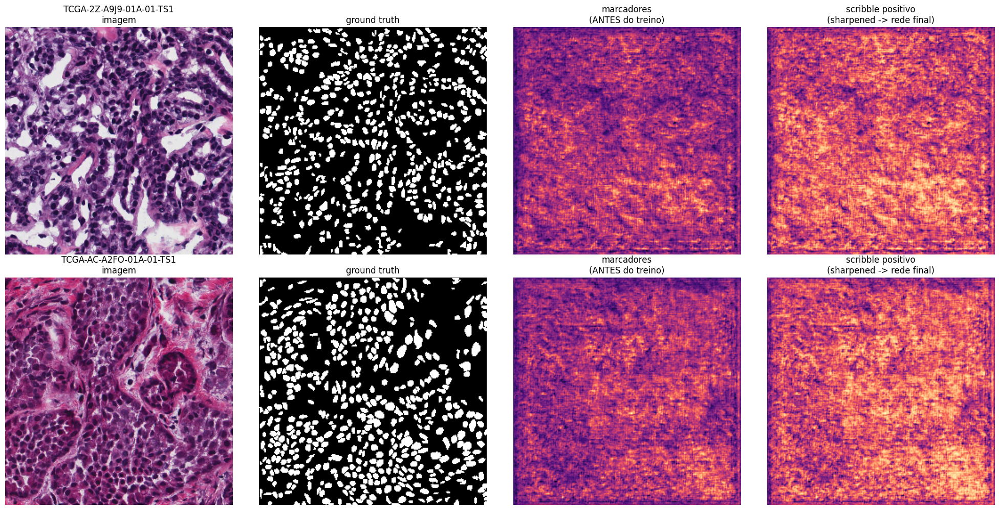

MarkerNet de volta a train(): True


In [12]:
# --- Marcadores ANTES do treino (linha de base) ---
# Rede recém-inicializada: o que a MarkerNet produz antes de qualquer otimização.
def tensor_to_np(t, i=0):
    return t.detach().cpu().numpy()[i, 0]


def to_scribbles_vis(net, markers_tensor):
    """Scribbles que a rede final recebe (sharpened no ScribblePrompt; [s, 1-s] na Dummy)."""
    if hasattr(net, "_prepare_scribbles"):
        return net._prepare_scribbles(markers_tensor, DEVICE)  # (N, 2, H, W)
    s = markers_tensor.float()
    return torch.cat([s, 1.0 - s], dim=1)


marker_net.model.eval()
N = min(2, len(val_batches))
fig, axes = plt.subplots(N, 4, figsize=(20, 5 * N))
if N == 1:
    axes = axes[None, :]

for row, batch in enumerate(val_batches[:N]):
    with torch.no_grad():
        out = training_pipeline.run(batch, verbose=False)

    img = batch["image"][0].permute(1, 2, 0).numpy()
    if img.max() > 1.0:
        img = img / 255.0
    gt = tensor_to_np(batch["ground_truth"])
    markers = tensor_to_np(out["markers"])
    scrib_pos = to_scribbles_vis(FINAL_NET, out["markers"])[0, 0].cpu().numpy()

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(f"{batch['id'][0]}\nimagem")
    axes[row, 1].imshow(gt, cmap="gray")
    axes[row, 1].set_title("ground truth")
    axes[row, 2].imshow(markers, cmap="magma")
    axes[row, 2].set_title("marcadores\n(ANTES do treino)")
    axes[row, 3].imshow(scrib_pos, cmap="magma")
    axes[row, 3].set_title("scribble positivo\n(sharpened -> rede final)")

    for ax in axes[row]:
        ax.axis("off")

plt.tight_layout()
plt.show()
marker_net.model.train()
print("MarkerNet de volta a train():", marker_net.model.training)


## 8. Treinamento — LossComposer + Trainer + TrainingLoop

Executamos **50 épocas** com **batches de 4 imagens de treino** e **validação a cada época**
(14 imagens oficiais de teste). A loss é composta por **Dice + RMSE + Size + DMap**:

- `Dice`/`RMSE`/`Size` supervisionam a **segmentação final** (saída da rede congelada);
- `DMap` supervisiona os **marcadores diretamente** (P11/C3/C4): penaliza ativação dos marcadores em
  bordas/fundo, empurrando-os para o interior das células;
- `Size` agora é **simétrico** (P10): penaliza tanto superestimar quanto subestimar a massa, com ótimo
  em pred.sum() == gt.sum().

Hiperparâmetros: lr 1e-4 com CosineAnnealing, **grad clip 1.0** (P5) e callback de **grad-norm** (E1).

> **Tempo estimado:** cada batch em GPU leva ~0,5–2s no forward/backward; com 8 batches × 50 épocas,
> espere de ~5 a 30 minutos dependendo da GPU.

In [13]:
composer = LossComposer([
    DiceTerm(),
    RMSETerm(),
    SizeTerm(weight=0.05),   # simétrico em torno de 1.0 (P10)
    DMapTerm(weight=0.1),    # supervisão direta dos marcadores (P11/C3/C4)
])

optimizer = torch.optim.Adam(marker_net.parameters(), lr=1e-4)  # lr menor (E6)
NUM_EPOCHS = 50
total_steps = NUM_EPOCHS * len(train_batches)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=total_steps)

# Diagnóstico de gradiente morto (P1/E1): acompanha a norma L2 dos gradientes da MarkerNet.
grad_norm_cb = GradNormCallback(log_every=1)

trainer = Trainer(
    training_pipeline=training_pipeline,
    loss_composer=composer,
    optimizer=optimizer,
    scheduler=scheduler,
    grad_clip=1.0,           # P5
    callbacks=[grad_norm_cb],
    device=DEVICE,
)

loop = TrainingLoop(
    trainer=trainer,
    train_loader=train_batches,
    val_loader=val_batches,
    num_epochs=NUM_EPOCHS,
    validate_every=1,
    log_every=5,
)

history = loop.run()
print("train_loss:", [f"{x:.4f}" for x in history["train_loss"]])
print("val_loss:", [f"{x:.4f}" for x in history["val_loss"]])
print("terms:", {k: [f"{v:.4f}" for v in vals] for k, vals in history["train_terms"].items()})
print("grad_norm (total):", [f"{v:.3e}" for v in grad_norm_cb.history["total"]])


2026-08-14 12:46:28.328 | INFO     | src.training.trainer:__init__:150 - [Trainer] Initialized on cuda
2026-08-14 12:46:28.343 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:46:28.368 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)
2026-08-14 12:46:28.777 | INFO     | src.training.callbacks.grad_norm_callback:on_train_step_end:78 - [GradNorm] step=1 | total=1.000e+00 | mean_abs=8.385e-04 | max_abs=1.493e-02 | nonzero_frac=1.000
2026-08-14 12:46:28.794 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:46:28.812 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)
2026-08-14 12:46:28.943 | INFO   

train_loss: ['1.4005', '1.3392', '1.2904', '1.2550', '1.2100', '1.1826', '1.1577', '1.1388', '1.1098', '1.0928', '1.0719', '1.0708', '1.0490', '1.0371', '1.0267', '1.0196', '1.0030', '0.9911', '0.9845', '0.9754', '0.9666', '0.9652', '0.9490', '0.9496', '0.9338', '0.9325', '0.9196', '0.9156', '0.9085', '0.8983', '0.8972', '0.8861', '0.8779', '0.8699', '0.8642', '0.8513', '0.8447', '0.8365', '0.8298', '0.8243', '0.8147', '0.8092', '0.8034', '0.7990', '0.7949', '0.7919', '0.7898', '0.7885', '0.7878', '0.7876']
val_loss: ['1.4154', '1.3990', '1.3701', '1.3493', '1.3275', '1.3083', '1.2953', '1.2730', '1.2530', '1.2345', '1.2090', '1.2000', '1.2007', '1.1865', '1.1942', '1.1718', '1.1739', '1.1769', '1.1829', '1.1670', '1.1704', '1.1608', '1.1637', '1.1535', '1.1624', '1.1529', '1.1552', '1.1439', '1.1466', '1.1400', '1.1457', '1.1395', '1.1404', '1.1369', '1.1379', '1.1371', '1.1373', '1.1374', '1.1381', '1.1388', '1.1382', '1.1376', '1.1378', '1.1378', '1.1379', '1.1378', '1.1380', '1.138

## 9. Curvas de loss e grad-norm

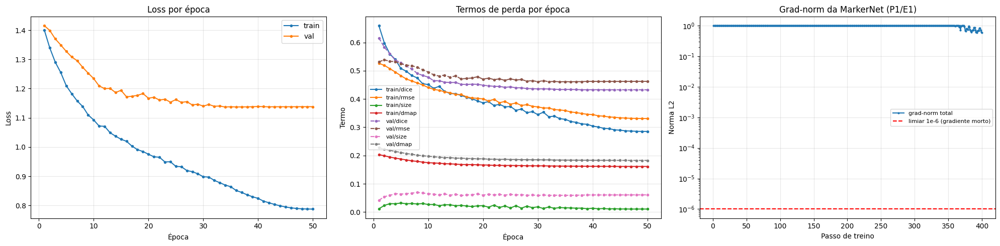

In [14]:
epochs = list(range(1, NUM_EPOCHS + 1))
steps = list(range(1, len(grad_norm_cb.history["total"]) + 1))

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].plot(epochs, history["train_loss"], label="train", marker="o", ms=3)
axes[0].plot(epochs, history["val_loss"], label="val", marker="o", ms=3)
axes[0].set_xlabel("Época")
axes[0].set_ylabel("Loss")
axes[0].set_title("Loss por época")
axes[0].legend()
axes[0].grid(alpha=0.3)

for name, vals in history["train_terms"].items():
    axes[1].plot(epochs, vals, label=f"train/{name}", marker="o", ms=3)
for name, vals in history["val_terms"].items():
    axes[1].plot(epochs, vals, label=f"val/{name}", marker="o", ms=3, linestyle="--")
axes[1].set_xlabel("Época")
axes[1].set_ylabel("Termo")
axes[1].set_title("Termos de perda por época")
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.3)

axes[2].plot(steps, grad_norm_cb.history["total"], label="grad-norm total", marker="o", ms=2)
axes[2].axhline(1e-6, color="red", linestyle="--", label="limiar 1e-6 (gradiente morto)")
axes[2].set_yscale("log")
axes[2].set_xlabel("Passo de treino")
axes[2].set_ylabel("Norma L2")
axes[2].set_title("Grad-norm da MarkerNet (P1/E1)")
axes[2].legend(fontsize=8)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()


## 10. Validações finais

In [15]:
import math

tl = history["train_loss"]
vl = history["val_loss"]

assert len(tl) == NUM_EPOCHS, f"Deveria haver {NUM_EPOCHS} épocas de treino"
assert len(vl) == NUM_EPOCHS, f"Deveria haver {NUM_EPOCHS} épocas de validação"
assert all(math.isfinite(x) for x in tl), "train_loss não é finita!"
assert all(math.isfinite(x) for x in vl), "val_loss não é finita!"

print(f"OK: todas as losses são finitas ({NUM_EPOCHS} épocas).")
print(f"train_loss: {tl[0]:.4f} -> {tl[-1]:.4f}")
print(f"val_loss:   {vl[0]:.4f} -> {vl[-1]:.4f}")

if tl[-1] < tl[0]:
    print(f"OK: loss de treino decresceu {tl[0]:.4f} -> {tl[-1]:.4f}")
else:
    print(f"[info] train_loss não decresceu ({tl[0]:.4f} -> {tl[-1]:.4f}) - confira o grad-norm acima")

print("\nTREINAMENTO COMPLETO!")
print(f"Melhor val_loss: {min(vl):.4f} (época {vl.index(min(vl)) + 1})")


OK: todas as losses são finitas (50 épocas).
train_loss: 1.4005 -> 0.7876
val_loss:   1.4154 -> 1.1381
OK: loss de treino decresceu 1.4005 -> 0.7876

TREINAMENTO COMPLETO!
Melhor val_loss: 1.1369 (época 34)


## 11. Visualização — predições nas imagens de validação (teste oficial)

2026-08-14 12:47:38.080 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:47:38.100 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)
2026-08-14 12:47:38.159 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:47:38.179 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)
2026-08-14 12:47:38.231 | DEBUG    | src.pipeline.steps.inference.marker_step:forward:130 - [MarkerStep] Generated markers with shape (4, 1, 256, 256)
2026-08-14 12:47:38.254 | DEBUG    | src.pipeline.steps.inference.frozen_segmentation_step:forward:110 - [FrozenSegmentationStep] Generated segmentation with shape (4, 1, 256, 256)


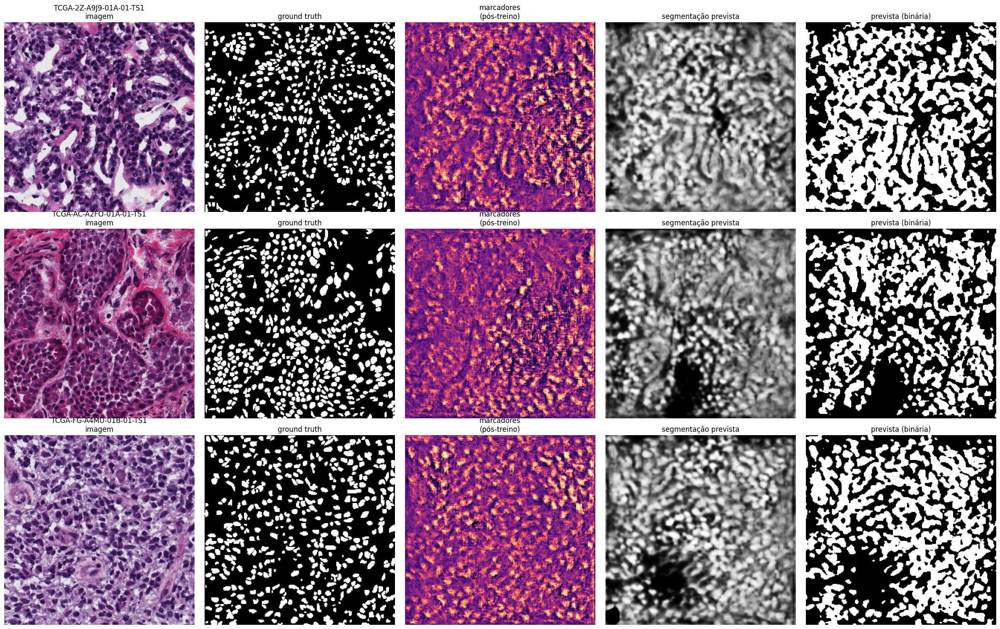

In [16]:
def tensor_to_np(t, i=0):
    return t.detach().cpu().numpy()[i, 0]


N = min(3, len(val_batches))
fig, axes = plt.subplots(N, 5, figsize=(24, 5 * N))  # 5 colunas: agora inclui marcadores
if N == 1:
    axes = axes[None, :]

for row, batch in enumerate(val_batches[:N]):
    with torch.no_grad():
        out = training_pipeline.run(batch, verbose=False)

    img = batch["image"][0].permute(1, 2, 0).numpy()
    if img.max() > 1.0:
        img = img / 255.0
    gt = tensor_to_np(batch["ground_truth"])
    markers = tensor_to_np(out["markers"])
    seg = tensor_to_np(out["segmentation"])

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(f"{batch['id'][0]}\nimagem")
    axes[row, 1].imshow(gt, cmap="gray")
    axes[row, 1].set_title("ground truth")
    axes[row, 2].imshow(markers, cmap="magma")
    axes[row, 2].set_title("marcadores\n(pós-treino)")
    axes[row, 3].imshow(seg, cmap="gray")
    axes[row, 3].set_title("segmentação prevista")
    axes[row, 4].imshow(seg > 0.5, cmap="gray")
    axes[row, 4].set_title("prevista (binária)")

    for ax in axes[row]:
        ax.axis("off")

plt.tight_layout()
plt.show()


## 12. Salvar checkpoint

Salva os pesos da **MarkerNet treinada** em `checkpoints/marker_net_trained.pt` para uso posterior em
inferência, junto com a configuração completa do run (P12/E8).

In [ ]:
os.makedirs("checkpoints", exist_ok=True)
ckpt_path = os.path.join("checkpoints", "marker_net_trained.pt")

torch.save(
    {
        "state_dict": marker_net.state_dict(),
        "config": UNET_CONFIG,
        "epochs": NUM_EPOCHS,
        "size": WORK_SIZE,
        "batch_size": BATCH_SIZE,
        "best_val_loss": min(history["val_loss"]),
        "grad_norm_mean": float(np.mean(grad_norm_cb.history["total"])),
    },
    ckpt_path,
)
print(f"Checkpoint salvo em {ckpt_path}")
print("Arquivos em checkpoints/:", os.listdir("checkpoints"))


Checkpoint salvo em checkpoints/marker_net_trained.pt
Arquivos em checkpoints/: ['ScribblePrompt_unet_v1_nf192_res128.pt', 'marker_net_trained.pt']
